
{{title_its_nb2}}

{{intro}}

This notebook illustrates initial steps involved in working with a large raster dataset (the ITS_LIVE granule that we read in the previous notebook) and subsetting it to the spatial domain of a smaller area of interest. To clip ITS_LIVE data to the extent of a single glacier, we use a vector dataset of glacier outlines, the [Randolph Glacier Inventory](https://nsidc.org/data/nsidc-0770). 

We work through challenges that come with working with larger-than-memory datasets and complex geometries. The tools we will use include **xarray**, **dask**, **rioxarray**, **geopandas**, and **flox**. 

{{outline}}

(content.Section_A)=
**[A. Read and organize gridded ice velocity (raster) data](#a-read-and-organize-gridded-ice-velocity-raster-data)**
- {{a1_its_nb2}}
- {{a2_its_nb2}}

(content.Section_B)=
**[B. Incorporate glacier outline (vector) data](#b-incorporate-glacier-outline-vector-data)**
- {{b1_its_nb2}}
- {{b2_its_nb2}}
- {{b3_its_nb2}}

(content.Section_C)=
**[C. Join raster and vector data - single glacier](#c-join-raster-and-vector-data---single-glacier)**
- {{c1_its_nb2}}
- {{c2_its_nb2}}

{{learning_goals}}

{{concepts}}
- Characteristics of larger than memory gridded data
- 'Lazy' v. 'non-lazy' operations
- Troubleshooting code errors and warnings

{{techniques}}
- Read + write large data with [Xarray](), [Zarr](), and [Dask]()
- Label-based indexing and selection
- Interactive visualizations with [Folium]() and [GeoPandas]()
- Clip raster data with vector data using [Rioxarray]()

Expand the next cell to see specific packages used in this notebook and relevant system and version information. 

In [1]:
%xmode minimal
import inspect
import warnings

import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rioxarray as rx
import xarray as xr
from dask.distributed import Client, LocalCluster
from shapely.geometry import MultiPolygon, Point, Polygon

warnings.simplefilter(action='ignore', category=FutureWarning)

Exception reporting mode: Minimal


## A. Read and organize gridded ice velocity (raster) data

This section uses functions we defined in the data access notebook, all of which are stored in the `itslivetools.py` file. If you cloned this tutorial from its github [repository](https://github.com/e-marshall/itslive) you'll see that `itslivetools.py` is in the same directory as our current notebook, so we can import it with the following line: 

In [2]:
import itslivetools

Read in the catalog again, and use the `find_granule_by_point()` to find the URL that points to the ITS_LIVE granule covering your area of interest.

In [3]:
itslive_catalog = gpd.read_file('https://its-live-data.s3.amazonaws.com/datacubes/catalog_v02.json')
#Find urls for granule covering point of interest
url = itslivetools.find_granule_by_point([95.180191, 30.645973])
url

'http://its-live-data.s3.amazonaws.com/datacubes/v2-updated-october2024/N30E090/ITS_LIVE_vel_EPSG32646_G0120_X750000_Y3350000.zarr'

### {{a1_its_nb2}}
1) Compare approaches for reading larger-than-memory data

The function that we defined in the previous notebook, `read_in_s3()`, supports different options for reading large, chunked raster datasets. Before we use that again in this notebook, we will explore these options and the ways that they can impact how we work with the data. You can learn more about reading Zarr data with Xarray [here](https://docs.xarray.dev/en/stable/user-guide/io.html#zarr), and see the different chunking options that are supported and which we will demonstrate below [here](https://docs.xarray.dev/en/stable/generated/xarray.open_dataset.html).

#### `Chunks = 'auto'`
This is the default option in `read_in_s3()`. The Xarray documentation states that `chunks='auto'` uses "dask `auto` chunking, taking into account the engine preferred chunks". 

In [4]:
dc_auto = xr.open_dataset(url, engine='zarr', chunks='auto')
dc_auto

<xarray.Dataset> Size: 1TB
Dimensions:                     (mid_date: 47892, y: 833, x: 833)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 383kB 2022-06-07T04...
  * x                           (x) float64 7kB 7.001e+05 7.003e+05 ... 8e+05
  * y                           (y) float64 7kB 3.4e+06 3.4e+06 ... 3.3e+06
Data variables: (12/60)
    M11                         (mid_date, y, x) float32 133GB dask.array<chunksize=(47892, 20, 20), meta=np.ndarray>
    M11_dr_to_vr_factor         (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    M12                         (mid_date, y, x) float32 133GB dask.array<chunksize=(47892, 20, 20), meta=np.ndarray>
    M12_dr_to_vr_factor         (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    acquisition_date_img1       (mid_date) datetime64[ns] 383kB dask.array<chunksize=(47892,), meta=np.ndarray>
    acquisition_date_img2       (mid_date) datetime64[ns] 383kB dask.array<chunksize=(47892,), meta=np.ndarray>
    ...                          ...
    vy_error_modeled            (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_error_slow               (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_error_stationary         (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_stable_shift             (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_stable_shift_slow        (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_stable_shift_stationary  (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

In this instance, the chunks of the object created with `xr.open_dataset(..., chunks='auto')` are a multiple of the on-disk chunk sizes.

In [5]:
dc_auto

<xarray.Dataset> Size: 1TB
Dimensions:                     (mid_date: 47892, y: 833, x: 833)
Coordinates:
  * mid_date                    (mid_date) datetime64[ns] 383kB 2022-06-07T04...
  * x                           (x) float64 7kB 7.001e+05 7.003e+05 ... 8e+05
  * y                           (y) float64 7kB 3.4e+06 3.4e+06 ... 3.3e+06
Data variables: (12/60)
    M11                         (mid_date, y, x) float32 133GB dask.array<chunksize=(47892, 20, 20), meta=np.ndarray>
    M11_dr_to_vr_factor         (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    M12                         (mid_date, y, x) float32 133GB dask.array<chunksize=(47892, 20, 20), meta=np.ndarray>
    M12_dr_to_vr_factor         (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    acquisition_date_img1       (mid_date) datetime64[ns] 383kB dask.array<chunksize=(47892,), meta=np.ndarray>
    acquisition_date_img2       (mid_date) datetime64[ns] 383kB dask.array<chunksize=(47892,), meta=np.ndarray>
    ...                          ...
    vy_error_modeled            (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_error_slow               (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_error_stationary         (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_stable_shift             (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_stable_shift_slow        (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
    vy_stable_shift_stationary  (mid_date) float32 192kB dask.array<chunksize=(47892,), meta=np.ndarray>
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

The [data model]() section/notebook discussed scalar information that is stored as attributes attached to Xarray objects. Similarly, Xarray objects read from Zarr datacubes have associated `encodings` that tell Xarray how to read and write the object to disk. We can use the encoding to learn about preferred chunking schemes. 

In [6]:
dc_auto['v'].encoding

{'chunks': (20000, 10, 10),
 'preferred_chunks': {'mid_date': 20000, 'y': 10, 'x': 10},
 'compressor': Blosc(cname='zlib', clevel=2, shuffle=SHUFFLE, blocksize=0),
 'filters': None,
 'missing_value': -32767,
 'dtype': dtype('int16')}

In [7]:
dc_auto['v']

<xarray.DataArray 'v' (mid_date: 47892, y: 833, x: 833)> Size: 133GB
dask.array<open_dataset-v, shape=(47892, 833, 833), dtype=float32, chunksize=(47892, 20, 20), chunktype=numpy.ndarray>
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 383kB 2022-06-07T04:21:44.211208960 ....
  * x         (x) float64 7kB 7.001e+05 7.003e+05 7.004e+05 ... 7.999e+05 8e+05
  * y         (y) float64 7kB 3.4e+06 3.4e+06 3.4e+06 ... 3.3e+06 3.3e+06
Attributes:
    description:    velocity magnitude
    grid_mapping:   mapping
    standard_name:  land_ice_surface_velocity
    units:          meter/year

For the encoding of the `v` variable, it looks like the chunking scheme is expected to be `{'mid_date': 2000, 'y':10, 'x':10}`. However, the chunks for this variable created with `chunks='auto'` are `{'mid_date': 47892, 'y': 20, 'x': 20}`. 

Let's take a look at the encoding for a 1-dimensional variable:

In [8]:
dc_auto['vx_error']

<xarray.DataArray 'vx_error' (mid_date: 47892)> Size: 192kB
dask.array<open_dataset-vx_error, shape=(47892,), dtype=float32, chunksize=(47892,), chunktype=numpy.ndarray>
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 383kB 2022-06-07T04:21:44.211208960 ....
Attributes:
    description:    best estimate of x_velocity error: vx_error is populated ...
    standard_name:  vx_error
    units:          meter/year

In [9]:
dc_auto['vx_error'].encoding

{'chunks': (56147,),
 'preferred_chunks': {'mid_date': 56147},
 'compressor': Blosc(cname='zlib', clevel=2, shuffle=SHUFFLE, blocksize=0),
 'filters': None,
 '_FillValue': np.float32(-32767.0),
 'dtype': dtype('float32')}

Interesting. We see that:
- The chunk size specified in the encoding doesn't match the total length of the `mid_date` dimension. It may be an artifact from an earlier step in the data processing chain before some observations were eliminated.
- The encoding specifies a single chunk along the `mid_date` dimension for this variable, which matches the object we read into memory, the size of this chunk is just different. 

Another thing to note is that it looks like some of the variables within this `xr.Dataset` have different chunk sizes on the `y` dimension (Shown by  the error produced below). We will need to address this later before rechunking the dataset.

In [10]:
dc_auto.chunksizes

ValueError: Object has inconsistent chunks along dimension y. This can be fixed by calling unify_chunks().

In [11]:
dc_auto = dc_auto.unify_chunks()

In [12]:
dc_auto.chunksizes

Frozen({'mid_date': (32736, 15156), 'y': (20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 13), 'x': (20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 13)})

#### `Chunks = {}`

For this argument, the documentation says: "loads the data with dask using the engine’s preferred chunk size, generally identical to the format’s chunk size. If not available, a single chunk for all arrays."

Note that with this dataset, `'auto'` and `{}` don't return the same chunking scheme.

In [13]:
dc_set = xr.open_dataset(url, engine='zarr', chunks={})

In [14]:
dc_set['v'].encoding

{'chunks': (20000, 10, 10),
 'preferred_chunks': {'mid_date': 20000, 'y': 10, 'x': 10},
 'compressor': Blosc(cname='zlib', clevel=2, shuffle=SHUFFLE, blocksize=0),
 'filters': None,
 'missing_value': -32767,
 'dtype': dtype('int16')}

In [15]:
dc_set['v']

<xarray.DataArray 'v' (mid_date: 47892, y: 833, x: 833)> Size: 133GB
dask.array<open_dataset-v, shape=(47892, 833, 833), dtype=float32, chunksize=(20000, 10, 10), chunktype=numpy.ndarray>
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 383kB 2022-06-07T04:21:44.211208960 ....
  * x         (x) float64 7kB 7.001e+05 7.003e+05 7.004e+05 ... 7.999e+05 8e+05
  * y         (y) float64 7kB 3.4e+06 3.4e+06 3.4e+06 ... 3.3e+06 3.3e+06
Attributes:
    description:    velocity magnitude
    grid_mapping:   mapping
    standard_name:  land_ice_surface_velocity
    units:          meter/year

With this approach, we see that the chunking on the 3-dimensional variable we looked at above ('v') *does* match the chunking specified in the object's encoding: `{'mid_date': 20000, 'y': 10, 'x': 10}`. 

Looking at a one-dimensional variable, we see the same occurrence as with `dc_auto`: the number of chunks matches what is specified in the encoding, but the size of the chunk is different.


In [16]:
dc_set['vx_error'].encoding

{'chunks': (56147,),
 'preferred_chunks': {'mid_date': 56147},
 'compressor': Blosc(cname='zlib', clevel=2, shuffle=SHUFFLE, blocksize=0),
 'filters': None,
 '_FillValue': np.float32(-32767.0),
 'dtype': dtype('float32')}

In [17]:
dc_set['vx_error']

<xarray.DataArray 'vx_error' (mid_date: 47892)> Size: 192kB
dask.array<open_dataset-vx_error, shape=(47892,), dtype=float32, chunksize=(47892,), chunktype=numpy.ndarray>
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 383kB 2022-06-07T04:21:44.211208960 ....
Attributes:
    description:    best estimate of x_velocity error: vx_error is populated ...
    standard_name:  vx_error
    units:          meter/year

The `v` and `vx_error` variables shown above have different chunk sizes along the `mid_date` dimension, so we can expect the same chunk sizes error as above, but this time for `mid_date`:

In [18]:
dc_set.chunksizes

ValueError: Object has inconsistent chunks along dimension mid_date. This can be fixed by calling unify_chunks().

However this time, if try to resolve the above error like we did for `dc_auto`, We get a performance warning about the number of chunks increasing by a factor of 186.
```python
dc_set = dc_set.unify_chunks()
```

```
 PerformanceWarning: Increasing number of chunks by factor of 186_, chunked_data = chunkmanager.unify_chunks(*unify_chunks_args)
```



#### An out-of-order time dimension
When we read this dataset from the S3 bucket, we get an object where the time dimension is not in chronological order. Because the dataset is so large, fixing this is not entirely straightforward.

Tip: It's always a good idea to look at the data!

In [19]:
dc_set.mid_date

<xarray.DataArray 'mid_date' (mid_date: 47892)> Size: 383kB
array(['2022-06-07T04:21:44.211208960', '2018-04-14T04:18:49.171219968',
       '2017-02-10T16:15:50.660901120', ..., '2024-01-23T04:18:19.231119104',
       '2023-06-01T04:10:44.893907968', '2023-09-02T16:18:20.230413056'],
      dtype='datetime64[ns]')
Coordinates:
  * mid_date  (mid_date) datetime64[ns] 383kB 2022-06-07T04:21:44.211208960 ....
Attributes:
    description:    midpoint of image 1 and image 2 acquisition date and time...
    standard_name:  image_pair_center_date_with_time_separation

The standard approach would be calling Xarray's [`.sortby()`]((https://docs.xarray.dev/en/stable/generated/xarray.Dataset.sortby.html)) method:
```python
dc_set = dc_set.sortby('mid_date')
```

Performing an operation like sorting or slicing requires the entire array to be loaded into memory; for a larage dimension like `mid_date` (~48,000 elements), would be very slow and/or would max out available computationall resoures. 

There may be a chunking strategy that successfully allows one to sort this dataset along the `mid_date` dimension, but when I tried a few different re-chunking approaches, they did not work. Instead, the sucessful approach I found was a bit counterintuitive: Re-read the dataset into memory *without* dask. This let's us use Xarray's 'lazy indexing' functionality; we can sort the dataset without loading it into memory. The object will still be quite large so we will chunk the data, incorporating dask, after we sort by the time dimension.

#### Read the dataset without Dask

We'll again use the `read_in_s3()` function, but this time passing `chunks_arg = None`. This is the same as running: `dc = xr.open_dataset(url, engine='Zarr')`. The `read_in_s3()` signature is shown below as a reminder:

In [20]:
signature = inspect.signature(itslivetools.read_in_s3)
print(signature)

(http_url: str, chunks: Union[NoneType, str, dict] = 'auto') -> xarray.core.dataset.Dataset


In [21]:
dc = itslivetools.read_in_s3(url, chunks=None)
dc

<xarray.Dataset> Size: 1TB
Dimensions:                     (mid_date: 47892, y: 833, x: 833)
Coordinates:
    mapping                     <U1 4B ...
  * mid_date                    (mid_date) datetime64[ns] 383kB 2022-06-07T04...
  * x                           (x) float64 7kB 7.001e+05 7.003e+05 ... 8e+05
  * y                           (y) float64 7kB 3.4e+06 3.4e+06 ... 3.3e+06
Data variables: (12/59)
    M11                         (mid_date, y, x) float32 133GB ...
    M11_dr_to_vr_factor         (mid_date) float32 192kB ...
    M12                         (mid_date, y, x) float32 133GB ...
    M12_dr_to_vr_factor         (mid_date) float32 192kB ...
    acquisition_date_img1       (mid_date) datetime64[ns] 383kB ...
    acquisition_date_img2       (mid_date) datetime64[ns] 383kB ...
    ...                          ...
    vy_error_modeled            (mid_date) float32 192kB ...
    vy_error_slow               (mid_date) float32 192kB ...
    vy_error_stationary         (mid_date) float32 192kB ...
    vy_stable_shift             (mid_date) float32 192kB ...
    vy_stable_shift_slow        (mid_date) float32 192kB ...
    vy_stable_shift_stationary  (mid_date) float32 192kB ...
Attributes: (12/19)
    Conventions:                CF-1.8
    GDAL_AREA_OR_POINT:         Area
    author:                     ITS_LIVE, a NASA MEaSUREs project (its-live.j...
    autoRIFT_parameter_file:    http://its-live-data.s3.amazonaws.com/autorif...
    datacube_software_version:  1.0
    date_created:               25-Sep-2023 22:00:23
    ...                         ...
    s3:                         s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    skipped_granules:           s3://its-live-data/datacubes/v2/N30E090/ITS_L...
    time_standard_img1:         UTC
    time_standard_img2:         UTC
    title:                      ITS_LIVE datacube of image pair velocities
    url:                        https://its-live-data.s3.amazonaws.com/datacu...

As we saw above, the `mid_date` dimension is still out of order:

In [22]:
dc.mid_date

<xarray.DataArray 'mid_date' (mid_date: 47892)> Size: 383kB
array(['2022-06-07T04:21:44.211208960', '2018-04-14T04:18:49.171219968',
       '2017-02-10T16:15:50.660901120', ..., '2024-01-23T04:18:19.231119104',
       '2023-06-01T04:10:44.893907968', '2023-09-02T16:18:20.230413056'],
      dtype='datetime64[ns]')
Coordinates:
    mapping   <U1 4B ...
  * mid_date  (mid_date) datetime64[ns] 383kB 2022-06-07T04:21:44.211208960 ....
Attributes:
    description:    midpoint of image 1 and image 2 acquisition date and time...
    standard_name:  image_pair_center_date_with_time_separation

### {{a2_its_nb2}}
2) Arrange dataset in chronological order

But now, we can lazily perform the `.sortby()` method.

In [23]:
dc = dc.sortby('mid_date')
dc.mid_date

<xarray.DataArray 'mid_date' (mid_date: 47892)> Size: 383kB
array(['1986-09-11T03:31:15.003252992', '1986-10-05T03:31:06.144750016',
       '1986-10-21T03:31:34.493249984', ..., '2024-10-29T04:18:09.241024000',
       '2024-10-29T04:18:09.241024000', '2024-10-29T04:18:09.241024000'],
      dtype='datetime64[ns]')
Coordinates:
    mapping   <U1 4B ...
  * mid_date  (mid_date) datetime64[ns] 383kB 1986-09-11T03:31:15.003252992 ....
Attributes:
    description:    midpoint of image 1 and image 2 acquisition date and time...
    standard_name:  image_pair_center_date_with_time_separation

Great! After some experimentation with different approaches, we have our dataset sorted in chronological order.

#### Convert to a dask-backed Xarray dataset

Not passing a `'chunks'` argument to `xr.open_dataset()` means that the Xarray object is a collection of Numpy arrays rather than Dask arrays. However, the dataset is still very large. We will need to use Dask even though we didn't read it in with Dask. We'll use the preferred chunking from `.encoding['chunks']` to specify a chunking scheme to the object and convert the underlying arrays from Numpy to Dask. 

```{note}
if end up adding data overview notebook, this should be moved there. in text above this note is text to keep from the passage below if it moves. 
```
However, the dataset is still very large: there are 60 variables that exist along 1,2 or, 3 dimensions (with the exception of the `mapping` variable which we will discuss later), and a single 3-d variable is 123 GB. We will still need to use Dask even though we didn't read it in as a collection of Dask arrays straight away. We will use the preferred chunk sizes we saw in the earlier objects in order to add a chunking scheme to this object and convert the numpy arrays to Dask arrays.

In [24]:
chunking_dict = dc_auto.chunksizes

In [25]:
dc_rechunk = dc.chunk(chunking_dict)

In [26]:
dc_rechunk.chunks

Frozen({'mid_date': (32736, 15156), 'y': (20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 13), 'x': (20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 13)})

Great, now we have our ITS_LIVE dataset organized by time, and with appropriate chunking. Let's move on and read in vector data describing some physical features we'd like to examine with the ITS_LIVE dataset.

## B. Incorporate glacier outline (vector) data

### {{b1_its_nb2}}

As discussed in the [Software and Data](software_and_data.ipynb#RGI) notebook, the examples in this tutorial use glacier outlines from the Randolph Glacier Inventory, version 7 (RGI7). We'll specifically be looking at the 'South Asia East' region.

In [27]:
se_asia = gpd.read_parquet('../data/rgi7_region15_south_asia_east.parquet')

It is **vital** to check the CRS, or Coordinate Reference Systems, when combining geospatial data from different sources. 

The RGI data are in the `EPSG:4326` CRS.

In [28]:
se_asia.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The CRS information for the ITS_LIVE dataset is stored in the `mapping` array. An easy way to discover this is to use the `cf_xarray` package and search for the `grid_mapping` variable if present.

In [29]:
import cf_xarray

dc.cf

Coordinates:
             CF Axes: * X: ['x']
                      * Y: ['y']
                        Z, T: n/a

      CF Coordinates:   longitude, latitude, vertical, time: n/a

       Cell Measures:   area, volume: n/a

      Standard Names: * image_pair_center_date_with_time_separation: ['mid_date']
                      * projection_x_coordinate: ['x']
                      * projection_y_coordinate: ['y']

              Bounds:   n/a

       Grid Mappings:   universal_transverse_mercator: ['mapping']

Data Variables:
       Cell Measures:   area, volume: n/a

      Standard Names:   M11_dr_to_vr_factor: ['M11_dr_to_vr_factor']
                        M12_dr_to_vr_factor: ['M12_dr_to_vr_factor']
                        autoRIFT_software_version: ['autoRIFT_software_version']
                        chip_size_height: ['chip_size_height']
                        chip_size_width: ['chip_size_width']
                        conversion_matrix_element_11: ['M11']
                       

In [30]:
import pyproj

cube_crs = pyproj.CRS.from_cf(dc.mapping.attrs)
cube_crs

<Projected CRS: EPSG:32646>
Name: WGS 84 / UTM zone 46N
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 46N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

This indicates that the data is projected to UTM zone 46N (EPSG:32646).

We choose to reproject the glacier outline to the CRS of the datacube:

In [31]:
# Project rgi data to match itslive
se_asia_prj = se_asia.to_crs(cube_crs) 
se_asia_prj.head(3)

,rgi_id,o1region,o2region,glims_id,anlys_id,subm_id,src_date,cenlon,cenlat,utm_zone,...,zmin_m,zmax_m,zmed_m,zmean_m,slope_deg,aspect_deg,aspect_sec,dem_source,lmax_m,geometry
0,RGI2000-v7.0-G-15-00001,15,15-01,G078088E31398N,866850,752,2002-07-10T00:00:00,78.087891,31.398046,44,...,4662.2950,4699.2095,4669.4720,4671.4253,13.427070,122.267290,4,COPDEM30,173,"POLYGON Z ((-924868.476 3571663.111 0, -924875..."
1,RGI2000-v7.0-G-15-00002,15,15-01,G078125E31399N,867227,752,2002-07-10T00:00:00,78.123699,31.397796,44,...,4453.3584,4705.9920,4570.9473,4571.2770,22.822983,269.669144,7,COPDEM30,1113,"POLYGON Z ((-921270.161 3571706.471 0, -921270..."
2,RGI2000-v7.0-G-15-00003,15,15-01,G078128E31390N,867273,752,2000-08-05T00:00:00,78.128510,31.390287,44,...,4791.7593,4858.6807,4832.1836,4827.6700,15.626262,212.719681,6,COPDEM30,327,"POLYGON Z ((-921061.745 3570342.665 0, -921062..."


How many glaciers are represented in the dataset?

In [32]:
len(se_asia_prj)

18587

#### Visualize spatial extents of glacier outlines and ITS_LIVE granule

In [Accessing S3 Data](accessing_s3_data.ipynb), we defined a function to create a vector object describing the footprint of a raster object; we'll use that again here.

In [33]:
#Get vector bbox of itslive
bbox_dc = itslivetools.get_bounds_polygon(dc_rechunk)
bbox_dc['geometry']
#Check that all objects have correct crs
assert dc_rechunk.attrs['projection'] == bbox_dc.crs == se_asia_prj.crs

<Axes: >

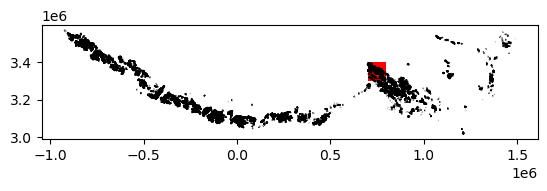

In [34]:
#Plot the outline of the itslive granule and the rgi dataframe together
fig, ax = plt.subplots()

bbox_dc.plot(ax=ax, facecolor='None', color='red')
se_asia_prj.plot(ax=ax, facecolor='None')

### {{b2_its_nb2}}
### 2) Crop vector data to spatial extent of raster data

The above plot shows the coverage of the vector dataset, in black, relative to the extent of the raster dataset, in red. We use the [geopandas `.clip()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.clip.html) method to subset the RGI polygons (`se_asia_prj`) to the footprint of the ITS_LIVE (`bbox_dc`) datacube.

In [35]:
#Subset rgi to bounds 
se_asia_subset = gpd.clip(se_asia_prj, bbox_dc)
se_asia_subset.head()

,rgi_id,o1region,o2region,glims_id,anlys_id,subm_id,src_date,cenlon,cenlat,utm_zone,...,zmin_m,zmax_m,zmed_m,zmean_m,slope_deg,aspect_deg,aspect_sec,dem_source,lmax_m,geometry
16373,RGI2000-v7.0-G-15-16374,15,15-03,G095930E29817N,930178,752,2005-09-08T00:00:00,95.929916,29.817003,46,...,4985.7314,5274.0435,5142.7660,5148.8170,27.024134,139.048110,4,COPDEM30,756,"POLYGON Z ((783110.719 3302487.481 0, 783148.4..."
16374,RGI2000-v7.0-G-15-16375,15,15-03,G095925E29818N,930160,752,2005-09-08T00:00:00,95.925181,29.818399,46,...,4856.2790,5054.9253,4929.5560,4933.6890,44.126980,211.518448,6,COPDEM30,366,"POLYGON Z ((782511.36 3302381.154 0, 782534.76..."
16376,RGI2000-v7.0-G-15-16377,15,15-03,G095915E29820N,930107,752,2005-09-08T00:00:00,95.914583,29.819510,46,...,5072.8910,5150.6196,5108.5020,5111.7217,23.980000,219.341537,6,COPDEM30,170,"POLYGON Z ((781619.822 3302305.074 0, 781613.5..."
16371,RGI2000-v7.0-G-15-16372,15,15-03,G095936E29819N,930215,752,2005-09-08T00:00:00,95.935554,29.819123,46,...,4838.7646,5194.8840,5001.5117,4992.3706,25.684517,128.737870,4,COPDEM30,931,"POLYGON Z ((783420.055 3302493.804 0, 783444.1..."
15879,RGI2000-v7.0-G-15-15880,15,15-03,G095459E29807N,928789,752,1999-07-29T00:00:00,95.459374,29.807181,46,...,3802.1846,4155.1255,4000.2695,4000.4404,28.155806,116.148640,4,COPDEM30,776,"POLYGON Z ((737667.211 3300277.169 0, 737702.8..."


We can use the `geopandas` `.explore()` method to interactively look at the RGI7 outlines contained within the ITS_LIVE granule:

In [36]:
m = folium.Map(max_lat = 31,max_lon = 95, min_lat = 29, min_lon = 97,
               location=[30.2, 95.5], zoom_start=8)

bbox_dc.explore(m=m, style_kwds = {'fillColor':'None', 'color':'red'},
                legend_kwds = {'labels': ['ITS_LIVE granule footprint']})
se_asia_subset.explore(m=m)

folium.LayerControl().add_to(m)
m

/Users/deepak/miniforge3/envs/raster/lib/python3.12/site-packages/folium/features.py:1173: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'rgi_id': 'RGI2000-v7.0-G-15-16433', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095721E29941N', 'anlys_id': 929520, 'subm_id': 752, 'src_date': '2005-09-08T00:00:00', 'cenlon': 95.7211016152286, 'cenlat': 29.940902187781784, 'utm_zone': 46, 'area_km2': 0.340954350813452, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.72222864596793, 'termlat': 29.937137080413784, 'zmin_m': 4657.792, 'zmax_m': 5049.5625, 'zmed_m': 4825.1104, 'zmean_m': 4839.4185, 'slope_deg': 23.704372, 'aspect_deg': 145.20973, 'aspect_sec': 4, 'dem_source': 'COPDEM30', 'lmax_m': 891}, {'rgi_id': 'RGI2000-v7.0-G-15-12194', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095869E30315N', 'anlys_id': 929951, 'subm_

---

While the above code correctly produces a plot, it also throws an warning. For a detailed example of trouble shooting and resolving this kind of warning, proceed to [Section D](initial_velocity_data_inspection.ipynb#D.-Small-side-trip-handling-different-geometry-types), otherwise, skip ahead to [Part 2](initial_velocity_data_inspection.ipynb#Part-3:-Join-raster-and-vector-data).

### {{b3_its_nb2}}
### 3) Optional: Handle different geometry types

It looks like we're getting a warning on the `explore()` method that is interfering with the functionality that displays feature info when you hover over a feature. Let's dig into it and see what's going on. It looks like the issue is being caused by rows of the `GeoDataFrame` object that have a 'GeometryCollection' geometry type. First, I'm going to copy the warning into a cell below. The warning is already in the form of a list of dictionaries, which makes it nice to work with:

Here is the error message separated from the problem geometries: 
```
/home/../python3.11/site-packages/folium/features.py:1102: UserWarning: GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: ..... to MultiPolygon for full functionality.
```
And below are the problem geometries identified in the error message saved as a list of dictionaries:

In [43]:
problem_geoms = [{'rgi_id': 'RGI2000-v7.0-G-15-16433', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095721E29941N', 'anlys_id': 929520, 'subm_id': 752, 'src_date': '2005-09-08T00:00:00', 'cenlon': 95.7211016152286, 'cenlat': 29.940902187781784, 'utm_zone': 46, 'area_km2': 0.340954350813452, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.72222864596793, 'termlat': 29.937137080413784, 'zmin_m': 4657.792, 'zmax_m': 5049.5625, 'zmed_m': 4825.1104, 'zmean_m': 4839.4185, 'slope_deg': 23.704372, 'aspect_deg': 145.20973, 'aspect_sec': 4, 'dem_source': 'COPDEM30', 'lmax_m': 891}, 
                 {'rgi_id': 'RGI2000-v7.0-G-15-12194', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095869E30315N', 'anlys_id': 929951, 'subm_id': 752, 'src_date': '2005-09-08T00:00:00', 'cenlon': 95.86889789565677, 'cenlat': 30.3147685, 'utm_zone': 46, 'area_km2': 8.797406997273084, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.89518363763428, 'termlat': 30.307036248571297, 'zmin_m': 4642.1445, 'zmax_m': 5278.752, 'zmed_m': 5011.06, 'zmean_m': 4993.9243, 'slope_deg': 12.372513, 'aspect_deg': 81.418945, 'aspect_sec': 3, 'dem_source': 'COPDEM30', 'lmax_m': 4994},
                 {'rgi_id': 'RGI2000-v7.0-G-15-11941', 'o1region': '15', 'o2region': '15-03', 'glims_id': 'G095301E30377N', 'anlys_id': 928228, 'subm_id': 752, 'src_date': '2007-08-20T00:00:00', 'cenlon': 95.30071978915663, 'cenlat': 30.3770025, 'utm_zone': 46, 'area_km2': 0.267701958906151, 'primeclass': 0, 'conn_lvl': 0, 'surge_type': 0, 'term_type': 9, 'glac_name': None, 'is_rgi6': 0, 'termlon': 95.30345982475616, 'termlat': 30.380097687364806, 'zmin_m': 5475.784, 'zmax_m': 5977.979, 'zmed_m': 5750.727, 'zmean_m': 5759.621, 'slope_deg': 41.069595, 'aspect_deg': 350.3331518173218, 'aspect_sec': 1, 'dem_source': 'COPDEM30', 'lmax_m': 807}]

First, convert the `problem_geoms` object from a list of dictionary objects to a `pandas.DataFrame` object:

In [44]:
problem_geoms_df = pd.DataFrame(data=problem_geoms)

Next, make a list of the IDs of the glaciers in this dataframe:

In [45]:
problem_geom_ids = problem_geoms_df['glims_id'].to_list()
problem_geom_ids

['G095721E29941N', 'G095869E30315N', 'G095301E30377N']

Make a `geopandas.GeoDataFrame` object that is just the above-identified outlines:

In [46]:
problem_geoms_gdf = se_asia_subset.loc[se_asia_subset['glims_id'].isin(problem_geom_ids)]

Check the geometry-type of these outlines and compare them to another outline from the `se_asia_subset` object that wasn't flagged:

In [47]:
problem_geoms_gdf.loc[problem_geoms_gdf['glims_id'] == 'G095301E30377N'].geom_type

11940    GeometryCollection
dtype: object

In [48]:
se_asia_subset.loc[se_asia_subset['rgi_id'] == 'RGI2000-v7.0-G-15-11754'].geom_type

11753    Polygon
dtype: object

Now, the warning we saw above makes more sense. Most features in `se_asia_subset` have `geom_type = Polygon` but the flagged features have `geom_type= GeometryCollection`. 

Let's dig a bit more into these flagged geometries. To do this, use the [geopandas method `explode()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explode.html) to split multiple geometries into multiple single geometries.

In [49]:
first_flagged_feature = problem_geoms_gdf[problem_geoms_gdf.glims_id == 'G095301E30377N'].geometry.explode(index_parts=True)

Printing this object shows that it actually contains a polygon geometry and a linestring geometry:

In [50]:
first_flagged_feature

11940  0    POLYGON Z ((721543.154 3362894.92 0, 721530.34...
       1    LINESTRING Z (721119.337 3362535.315 0, 721119...
Name: geometry, dtype: geometry

Let's look at the other two: 

In [51]:
second_flagged_feature = problem_geoms_gdf[problem_geoms_gdf.glims_id == 'G095869E30315N'].geometry.explode(index_parts=True)
second_flagged_feature

12193  0    POLYGON Z ((774975.604 3356334.67 0, 774983.91...
       1    LINESTRING Z (776713.643 3359150.691 0, 776713...
Name: geometry, dtype: geometry

In [52]:
third_flagged_feature = problem_geoms_gdf[problem_geoms_gdf.glims_id == 'G095721E29941N'].geometry.explode(index_parts=True)
third_flagged_feature

16432  0    POLYGON Z ((762550.755 3315675.227 0, 762550.8...
       1    LINESTRING Z (762974.041 3315372.04 0, 762974....
Name: geometry, dtype: geometry

Check out some properties of the line geometry objects, such as length:

In [53]:
print(third_flagged_feature[1:].length.iloc[0])
print(second_flagged_feature[1:].length.iloc[0])
print(third_flagged_feature[1:].length.iloc[0])

0.07253059141477144
0.07953751551142538
0.07253059141477144


It looks like all of the linestring objects are very small, possibly artifacts, and don't need to remain in the dataset. For simplicity, we can remove them from the original object. There are different ways to do this, but here's one approach:

1. Identify and remove all features with the `GeometryCollection` geom_type:

In [54]:
se_asia_subset_polygon = se_asia_subset[~se_asia_subset['geometry'].apply(lambda x : x.geom_type=='GeometryCollection' )]

2. Remove the line geometries from the `GeometryCollection` features:

In [55]:
se_asia_subset_geom_collection = se_asia_subset[se_asia_subset['geometry'].astype(object).apply(
    lambda x : x.geom_type=='GeometryCollection' )]

3. Make an object that is just the features where `geom_type` = Polygon:

In [56]:
keep_polygons = se_asia_subset_geom_collection.explode(index_parts=True).loc[se_asia_subset_geom_collection.explode(index_parts=True).geom_type == 'Polygon']

4. Append the polygons to the `se_asia_subset_polygons` object:

In [57]:
se_asia_polygons = pd.concat([se_asia_subset_polygon,keep_polygons])

As a sanity check, let's make sure that we didn't lose any glacier outline features during all of that:

In [58]:
len(se_asia_subset['rgi_id']) == len(se_asia_polygons)

True

Great, we know that we have the same number of glaciers that we started with. 

Now, let's try visualizing the outlines with `explore()` again and seeing if the hover tools work:

In [59]:
se_asia_polygons.explore()

We can use the above interactive map to select a glacier to look at in more detail below.

---

## C. Combining raster and vector data - single glacier

### {{c1_its_nb2}}
### 1) Crop ITS_LIVE granule to a single glacier outline

If we want to dig in and analyze this velocity dataset at smaller spatial scales, we first need to subset it. The following section and the next notebook ([Single Glacier Data Analysis](single_glacier_data_inspection.ipynb)) will focus on the spatial scale of a single glacier. 

In [37]:
#Select a  glacier to subset to
single_glacier_vec = se_asia_subset.loc[se_asia_subset['rgi_id'] == 'RGI2000-v7.0-G-15-16257']
single_glacier_vec

,rgi_id,o1region,o2region,glims_id,anlys_id,subm_id,src_date,cenlon,cenlat,utm_zone,...,zmin_m,zmax_m,zmed_m,zmean_m,slope_deg,aspect_deg,aspect_sec,dem_source,lmax_m,geometry
16256,RGI2000-v7.0-G-15-16257,15,15-03,G095962E29920N,930314,752,2005-09-08T00:00:00,95.961972,29.920094,46,...,4320.7065,5937.84,5179.605,5131.8877,22.803406,100.811325,3,COPDEM30,5958,"POLYGON Z ((788176.951 3315860.842 0, 788219.8..."


In [38]:
# Write it to file to that it can be used later
single_glacier_vec.to_file('../data/single_glacier_vec.json', driver='GeoJSON')

Check to see if the ITS_LIVE raster dataset has an assigned CRS attribute. We already know that the data is projected in the correct coordinate reference system (CRS), but the object may not be 'CRS-aware' yet (ie. have an attribute specifying its CRS). This is necessary for spatial operations such as clipping and reprojection. If `dc_rechunk` doesn't have a CRS attribute, use `rio.write_crs()` to assign it. For more detail, see Rioxarray's [CRS Management documentation](https://corteva.github.io/rioxarray/stable/getting_started/crs_management.html).

In [39]:
dc_rechunk.rio.crs

CRS.from_wkt('PROJCS["WGS 84 / UTM zone 46N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",93],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32646"]]')

Now, use the subset vector data object and Rioxarray's [`.clip()` method](https://corteva.github.io/rioxarray/html/examples/clip_geom.html) to crop the data cube.

In [40]:
%%time

single_glacier_raster = dc_rechunk.rio.clip(single_glacier_vec.geometry, single_glacier_vec.crs)

CPU times: user 547 ms, sys: 126 ms, total: 672 ms
Wall time: 727 ms


### {{c2_its_nb2}}
### 2) Write clipped object to file.
 
We want to use `single_glacier_raster` in the following notebook without going through all of the steps of creating it again. So, we write the object to file as a Zarr data cube so that we can easily read it into memory when we need it next. However, we'll see that there are a few steps we must go through before we can successfully write this object. 


We first re-chunk the `single_glacier_raster` into more optimal chunk sizes:

In [41]:
single_glacier_raster = single_glacier_raster.chunk({'mid_date':20000,
                                                             'x':10,
                                                             'y':10})

In [44]:
single_glacier_raster.to_zarr('../data/single_glacier_itslive.zarr', mode='w')

ValueError: Specified zarr chunks encoding['chunks']=(56147,) for variable named 'vx_error' would overlap multiple dask chunks ((20000, 20000, 7892),) on the region (slice(None, None, None),). Writing this array in parallel with dask could lead to corrupted data. Consider either rechunking using `chunk()`, deleting or modifying `encoding['chunks']`, or specify `safe_chunks=False`.

We tried to write `single_glacier_raster` (eg. `single_glacier_raster.to_zarr('data/glacier_itslive.zarr', mode='w')`) but received an error related to encoding. 

The root cause here is that the encoding recorded was appropriate for the source dataset, but is not valid anymore given all the transformations we have run up to this point. The easy solution here is to simply call `drop_encoding`. This will delete any existing encoding isntructions, and have Xarray automatically choose an encoding that will work well for the data. Optimizing the encoding of on-disk data is an advanced topic that we will not cover.

In [45]:
single_glacier_raster.drop_encoding().to_zarr('../data/single_glacier_itslive.zarr', mode='w')

Now, let's try to write the object as a Zarr group.

{{conclusion}}

In this notebook, we read a large object into memory, re-organized it and clipped it to the footprint of a single area of interest. We then saved that object to disk so that it can be easily re-used. The next notebook demonstrates exploratory data analysis steps using the object we just wrote to disk. 